# Thesis

- Topic: Plant Disease detection
- Author: Antriksh Kumar Singh
- Batch: October 21 (C11)

---

### Importing Libraries an initial checks

In [1]:
#  Installing required libraries
# !pip install --upgrade pip
# !pip install numpy tensorflow pandas matplotlib opencv-python tensorboard-plugin-profile pyyaml h5py sklearn
!pip list

Package                      Version
---------------------------- -----------
absl-py                      1.0.0
asttokens                    2.0.5
astunparse                   1.6.3
backcall                     0.2.0
black                        22.3.0
cachetools                   5.1.0
certifi                      2022.5.18.1
cfgv                         3.3.1
charset-normalizer           2.0.12
click                        8.1.3
colorama                     0.4.4
cycler                       0.11.0
debugpy                      1.6.0
decorator                    5.1.1
distlib                      0.3.4
entrypoints                  0.4
executing                    0.8.3
filelock                     3.4.2
flatbuffers                  1.12
fonttools                    4.33.3
gast                         0.4.0
google-auth                  2.6.6
google-auth-oauthlib         0.4.6
google-pasta                 0.2.0
grpcio                       1.46.3
gviz-api                     1.10.0
h5p

In [2]:
%load_ext tensorboard

In [3]:
# Clear any logs from previous runs
!rm -rf "./logs/"

In [4]:
# Importing all required libraries
import os
import pathlib as pl

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers

from mbp import ModelBuilderPipeline as mb
from mbp import ModelTestPipeline as mtp

In [5]:
# Check if GPU is recognized
tf.config.list_physical_devices("GPU")

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

---

### Importing Data

In [6]:
# Defining base paths
CWD = os.getcwd()
DATA_PATH = "./data"
ABS_DATA_PATH = os.path.join(CWD,DATA_PATH)
plant_village = pl.Path(ABS_DATA_PATH)

In [7]:
# Initialization global vars
batch_size = 16
img_height = 256
img_width = 256
seed = 123
channels = 3

In [8]:
# Loading the plant village dataset
pv = tf.keras.utils.image_dataset_from_directory(
  plant_village,
  batch_size=batch_size,
  image_size=(img_height,img_width),
  shuffle=True,
  seed=seed
)

Found 21840 files belonging to 23 classes.


In [9]:
# Dataset summary
pv

<BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>

In [10]:
# Plant Classes summary
all_classes = pv.class_names
all_images = list(plant_village.glob("*/*.jpg"))
all_classes_count = len(all_classes)
all_images_count = len(all_images)
print(f"Dataset have {all_classes_count} classes in total with {all_images_count} images\n")
print(all_classes)

Dataset have 23 classes in total with 21839 images

['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Cherry___Powdery_mildew', 'Cherry___healthy', 'Corn___Cercospora_leaf_spot Gray_leaf_spot', 'Corn___Common_rust', 'Corn___Northern_Leaf_Blight', 'Corn___healthy', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___healthy', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'Strawberry___Leaf_scorch', 'Strawberry___healthy']


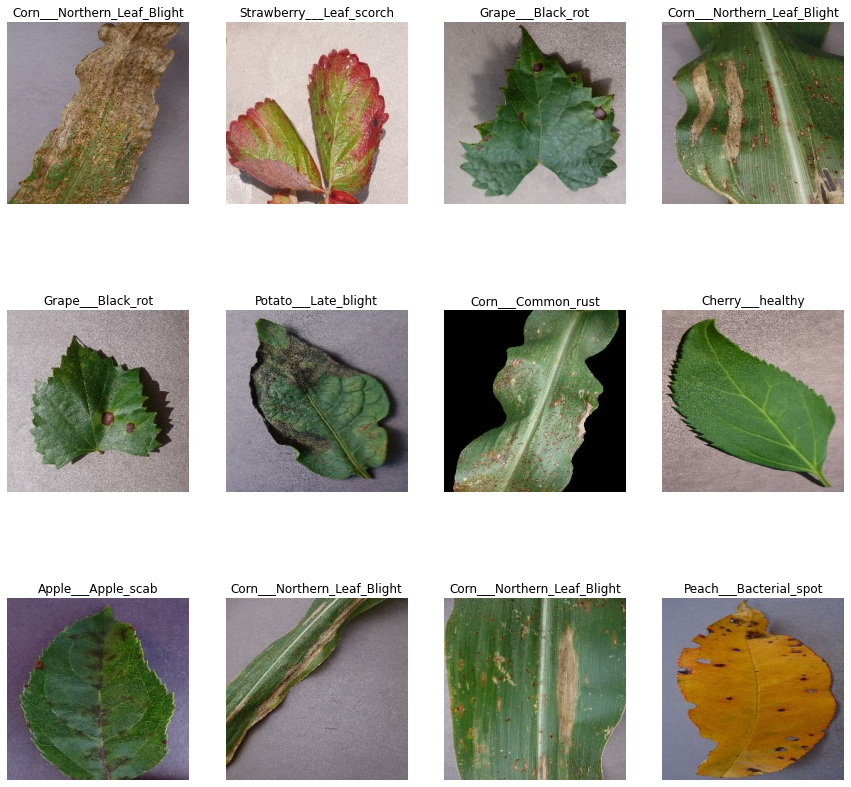

In [11]:
# Plotting random images the dataset batch
plt.figure(figsize = (15,15))
for image, label in pv.take(1):
    for i in range(12):
        plt.subplot(3, 4, i+1) # many plots at a time => subplots
        plt.imshow(image[i].numpy().astype('uint8')) #converting all data of image into numpy and than to integer type as they were in float.
        plt.title(all_classes[label[i]])  # title of the class_name of image
        plt.axis("off") # Hide the values of graph

---

### EDA

In [12]:
# Analyzing dataset
processed_labels = []
for _class in all_classes:
  if _class != "Background_without_leaves":
    l = _class.split('___')
    l.append(_class)
    processed_labels.append(l)

class_df = pd.DataFrame(processed_labels,columns=["plant","label","folder"])
class_df["abs_path"] = class_df["folder"].apply(lambda x: plant_village.joinpath(x))
class_df["images"] = class_df["abs_path"].apply(lambda x: len(os.listdir(x)))
class_df["is_healthy"] = class_df["label"]=="healthy"
class_df

,plant,label,folder,abs_path,images,is_healthy
0,Apple,Apple_scab,Apple___Apple_scab,d:\projects\masters\masters\Final Report\Code\...,630,False
1,Apple,Black_rot,Apple___Black_rot,d:\projects\masters\masters\Final Report\Code\...,621,False
2,Apple,Cedar_apple_rust,Apple___Cedar_apple_rust,d:\projects\masters\masters\Final Report\Code\...,275,False
3,Apple,healthy,Apple___healthy,d:\projects\masters\masters\Final Report\Code\...,1645,True
4,Cherry,Powdery_mildew,Cherry___Powdery_mildew,d:\projects\masters\masters\Final Report\Code\...,1052,False
5,Cherry,healthy,Cherry___healthy,d:\projects\masters\masters\Final Report\Code\...,854,True
6,Corn,Cercospora_leaf_spot Gray_leaf_spot,Corn___Cercospora_leaf_spot Gray_leaf_spot,d:\projects\masters\masters\Final Report\Code\...,513,False
7,Corn,Common_rust,Corn___Common_rust,d:\projects\masters\masters\Final Report\Code\...,1192,False
8,Corn,Northern_Leaf_Blight,Corn___Northern_Leaf_Blight,d:\projects\masters\masters\Final Report\Code\...,985,False
9,Corn,healthy,Corn___healthy,d:\projects\masters\masters\Final Report\Code\...,1162,True


In [13]:
# Total types of plants covered
all_plants = class_df["plant"].unique()
print(f"Plant village has images from {len(all_plants)} type of plants")

Plant village has images from 8 type of plants


In [14]:
# Summarizing dataset for binary classification at dataset level
health_summary = class_df.groupby('is_healthy').sum()
health_summary["ratio"]=health_summary["images"]/all_images_count
health_summary

,images,ratio
is_healthy,,
False,15310,0.701039
True,6530,0.299006


In [15]:
# Summarizing dataset for binary classification at plant level
pl_health_summary = class_df.groupby(['plant','is_healthy']).sum()
pl_health_summary

images
plant        is_healthy        
Apple        False         1526
             True          1645
Cherry       False         1052
             True           854
Corn         False         2690
             True          1162
Grape        False         3639
             True           423
Peach        False         2297
             True           360
Pepper,_bell False          997
             True          1478
Potato       False         2000
             True           152
Strawberry   False         1109
             True           456

---

### Test Train Split

In [16]:
# Function for Splitting the data
def split_dataset(ds, train_split=0.7, val_split=0.2, test_split=0.1, shuffle=True, shuffle_size=100):
  if shuffle:
    ds = ds.shuffle(shuffle_size, seed = seed)

  ds_size = len(ds)
  train_size = int(train_split * ds_size)
  val_size = int(val_split * ds_size)

  train_ds = ds.take(train_size)
  val_ds = ds.skip(train_size).take(val_size)
  test_ds = ds.skip(train_size).skip(val_size)

  return train_ds, test_ds, val_ds

In [17]:
train_ds, test_ds, val_ds = split_dataset(pv)

In [18]:
print(f"""
Number of batches in dataset : {len(pv)}
Number of batches in train dataset : {len(train_ds)}
Number of batches in validation dataset : {len(val_ds)}
Number of batches in test dataset : {len(test_ds)}
""")


Number of batches in dataset : 1365
Number of batches in train dataset : 955
Number of batches in validation dataset : 273
Number of batches in test dataset : 137



In [19]:
AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.cache().shuffle(100).prefetch(buffer_size=AUTOTUNE)
test_ds = test_ds.cache().shuffle(100).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().shuffle(100).prefetch(buffer_size=AUTOTUNE)

---

### Image Preprocessing

In [20]:
# Initialization global vars
batch_size = 16
img_height = 256
img_width = 256
seed = 123
channels = 3

res_img_height = 256
res_img_width = 256

In [21]:
input_shape = (img_height, img_width, channels)

In [22]:
# Image Preprocessing : Rescaling and Resizing
resize = tf.keras.Sequential([
    layers.Resizing(res_img_height, res_img_width,input_shape=input_shape)
])
rescale = tf.keras.Sequential([
    layers.Rescaling(1.0/255)
])

In [23]:
# Data augmentation by flipping and rotating existing images
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip(mode="horizontal_and_vertical"),
    layers.RandomRotation(factor = 0.5)
])

---

### Model Building

Model building pipelines is simplified in `mbp.py`

##### Model 1 : From Scratch CNN

In [24]:
m1 = mb(
    model=tf.keras.models.Sequential(
        [
            resize,
            layers.Conv2D(16, 3, padding="same", activation="relu"),
            layers.MaxPooling2D(),
            layers.Conv2D(32, 3, padding="same", activation="relu"),
            layers.MaxPooling2D(),
            layers.Conv2D(64, 3, padding="same", activation="relu"),
            layers.MaxPooling2D(),
            layers.Flatten(),
            layers.Dense(64, activation="relu"),
            layers.Dense(all_classes_count, activation="softmax"),
        ]
    ),
    input_shape=input_shape,
    name="m1"
)

👉 Building and compiling...
Total Parameter 4219447


In [25]:
m1.model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 256, 256, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 256, 256, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 128, 128, 16)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 128, 32)      4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 64, 64, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 64, 64, 64)       

👉 Building and compiling...
Total Parameter 4219447


👉 Fitting the model...
Epoch 1/30
955/955 [==============================] - 316s 298ms/step - loss: 3.0386 - accuracy: 0.4373 - val_loss: 1.0390 - val_accuracy: 0.6735
Epoch 2/30
955/955 [==============================] - 90s 94ms/step - loss: 0.8229 - accuracy: 0.7412 - val_loss: 0.7637 - val_accuracy: 0.7850
Epoch 3/30
955/955 [==============================] - 93s 98ms/step - loss: 0.4304 - accuracy: 0.8636 - val_loss: 0.7906 - val_accuracy: 0.7921
Epoch 4/30
955/955 [==============================] - 88s 92ms/step - loss: 0.3029 - accuracy: 0.9003 - val_loss: 1.0511 - val_accuracy: 0.7804
Epoch 5/30
955/955 [==============================] - 100s 105ms/step - loss: 0.2228 - accuracy: 0.9296 - val_loss: 0.9638 - val_accuracy: 0.7910
Epoch 6/30
955/955 [==============================] - 119s 125ms/step - loss: 0.2057 - accuracy: 0.9368 - val_loss: 1.3159 - val_accuracy: 0.7402
Epoch 7/30
955/955 [==============================] -

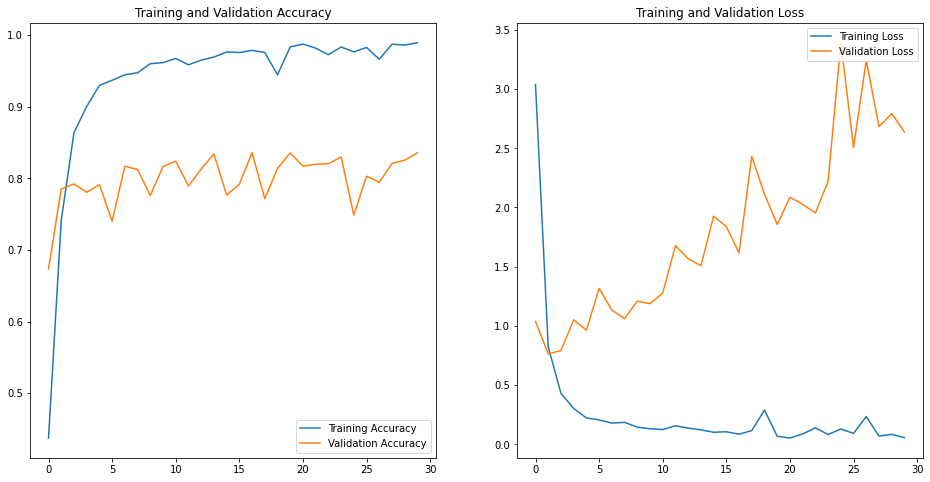

In [23]:
m1.run(tds=train_ds, vds=val_ds, ttds=test_ds)

##### Model 2 : With augmentation

👉 Building and compiling...
Total Parameter 4219447


👉 Fitting the model...
Epoch 1/30
955/955 [==============================] - 286s 294ms/step - loss: 1.6622 - accuracy: 0.4998 - val_loss: 0.9330 - val_accuracy: 0.7218
Epoch 2/30
955/955 [==============================] - 94s 98ms/step - loss: 0.7789 - accuracy: 0.7505 - val_loss: 0.7004 - val_accuracy: 0.7864
Epoch 3/30
955/955 [==============================] - 96s 101ms/step - loss: 0.5637 - accuracy: 0.8172 - val_loss: 0.8362 - val_accuracy: 0.7390
Epoch 4/30
955/955 [==============================] - 96s 101ms/step - loss: 0.4583 - accuracy: 0.8483 - val_loss: 0.4533 - val_accuracy: 0.8523
Epoch 5/30
955/955 [==============================] - 188s 197ms/step - loss: 0.3898 - accuracy: 0.8713 - val_loss: 0.4985 - val_accuracy: 0.8464
Epoch 6/30
955/955 [==============================] - 157s 164ms/step - loss: 0.3554 - accuracy: 0.8832 - val_loss: 0.5087 - val_accuracy: 0.8503
Epoch 7/30
955/955 [==============================]

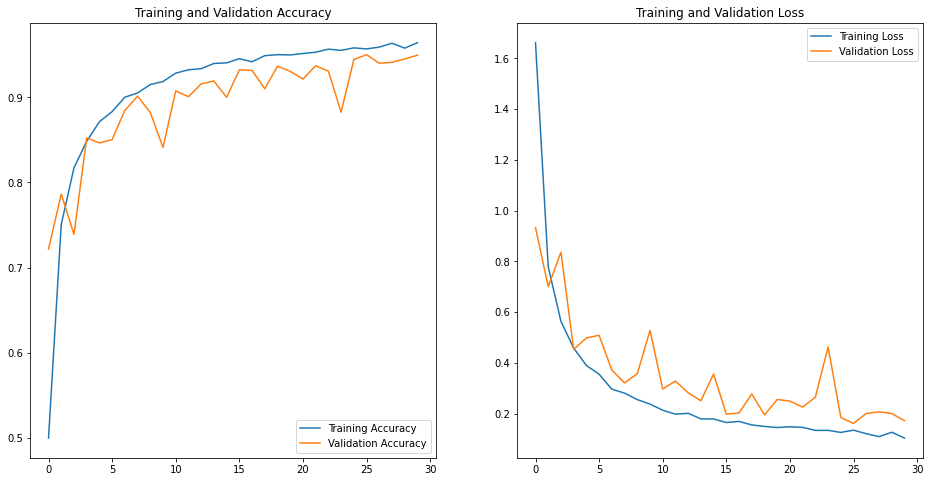

In [23]:
m2 = mb(
    model=tf.keras.models.Sequential(
        [
            resize,
            rescale,
            data_augmentation,
            layers.Conv2D(16, 3, padding="same", activation="relu"),
            layers.MaxPooling2D(),
            layers.Conv2D(32, 3, padding="same", activation="relu"),
            layers.MaxPooling2D(),
            layers.Conv2D(64, 3, padding="same", activation="relu"),
            layers.MaxPooling2D(),
            layers.Flatten(),
            layers.Dense(64, activation="relu"),
            layers.Dense(all_classes_count, activation="softmax"),
        ]
    ),
    input_shape=input_shape,
    name="m2"
)

m2.run(tds=train_ds, vds=val_ds, ttds=test_ds)


##### Model 3 : With  batch normalization

In [29]:
m3 = mb(
    model=tf.keras.models.Sequential(
        [
            resize,
            rescale,
            data_augmentation,
            layers.Conv2D(16, 3, padding="same", activation="relu"),
            layers.BatchNormalization(),
            layers.MaxPooling2D(),
            layers.Conv2D(32, 3, padding="same", activation="relu"),
            layers.MaxPooling2D(),
            layers.Conv2D(64, 3, padding="same", activation="relu"),
            layers.MaxPooling2D(),
            layers.Flatten(),
            layers.Dense(64, activation="relu"),
            layers.Dense(all_classes_count, activation="softmax"),
        ]
    ),
    input_shape=input_shape,
    name="m3"
)

👉 Building and compiling...
Total Parameter 4219511


In [30]:
m3.model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 256, 256, 3)       0         
                                                                 
 sequential_1 (Sequential)   (None, 256, 256, 3)       0         
                                                                 
 sequential_2 (Sequential)   (None, 256, 256, 3)       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 256, 256, 16)      448       
                                                                 
 batch_normalization (BatchN  (None, 256, 256, 16)     64        
 ormalization)                                                   
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 128, 128, 16)     0         
 2D)                                                  

👉 Building and compiling...
Total Parameter 4219511


👉 Fitting the model...
Epoch 1/30
955/955 [==============================] - 110s 114ms/step - loss: 1.3316 - accuracy: 0.6060 - val_loss: 0.9535 - val_accuracy: 0.7028
Epoch 2/30
955/955 [==============================] - 103s 108ms/step - loss: 0.6453 - accuracy: 0.7884 - val_loss: 0.6080 - val_accuracy: 0.8173
Epoch 3/30
955/955 [==============================] - 106s 111ms/step - loss: 0.4610 - accuracy: 0.8486 - val_loss: 0.9256 - val_accuracy: 0.7260
Epoch 4/30
955/955 [==============================] - 105s 110ms/step - loss: 0.3964 - accuracy: 0.8722 - val_loss: 0.8303 - val_accuracy: 0.7493
Epoch 5/30
955/955 [==============================] - 105s 110ms/step - loss: 0.3418 - accuracy: 0.8890 - val_loss: 0.3933 - val_accuracy: 0.8720
Epoch 6/30
955/955 [==============================] - 96s 101ms/step - loss: 0.2959 - accuracy: 0.9027 - val_loss: 0.9068 - val_accuracy: 0.7560
Epoch 7/30
955/955 [============================

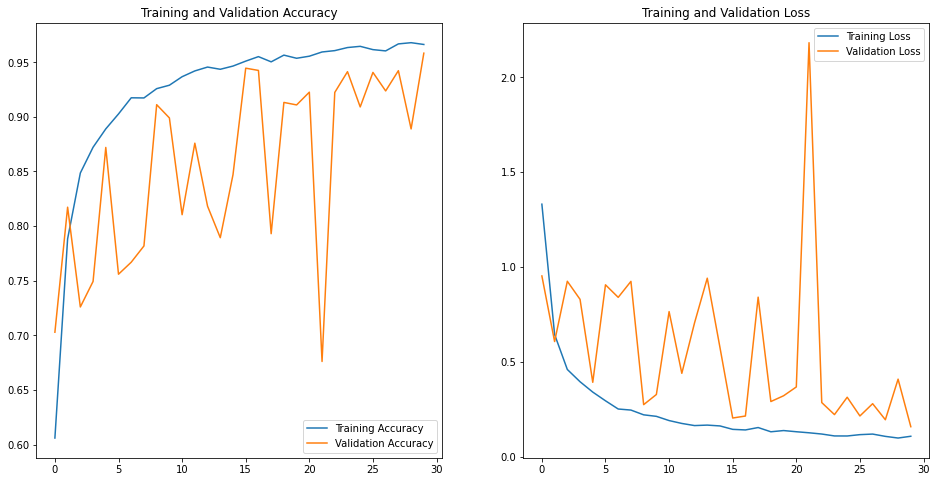

In [24]:
m3.run(tds=train_ds, vds=val_ds, ttds=test_ds)

##### Model 4 : With Dropouts

In [31]:
m4 = mb(
    model=tf.keras.models.Sequential(
        [
            resize,
            rescale,
            # data_augmentation,
            layers.Conv2D(16, 3, padding="same", activation="relu"),
            layers.MaxPooling2D(),
            layers.Conv2D(32, 3, padding="same", activation="relu"),
            layers.MaxPooling2D(),
            layers.Conv2D(64, 3, padding="same", activation="relu"),
            layers.MaxPooling2D(),
            layers.Flatten(),
            layers.Dropout(0.2),
            layers.Dense(64, activation="relu"),
            layers.Dense(all_classes_count, activation="softmax"),
        ]
    ),
    input_shape=input_shape,
    name="m4"
)

👉 Building and compiling...
Total Parameter 4219447


In [32]:
m4.model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 256, 256, 3)       0         
                                                                 
 sequential_1 (Sequential)   (None, 256, 256, 3)       0         
                                                                 
 conv2d_6 (Conv2D)           (None, 256, 256, 16)      448       
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 128, 128, 16)     0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 128, 128, 32)      4640      
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 64, 64, 32)       0         
 2D)                                                  

👉 Building and compiling...
Total Parameter 4219447


👉 Fitting the model...
Epoch 1/30
955/955 [==============================] - 83s 86ms/step - loss: 1.1607 - accuracy: 0.6507 - val_loss: 0.4699 - val_accuracy: 0.8546
Epoch 2/30
955/955 [==============================] - 83s 87ms/step - loss: 0.4074 - accuracy: 0.8700 - val_loss: 0.3930 - val_accuracy: 0.8837
Epoch 3/30
955/955 [==============================] - 72s 75ms/step - loss: 0.2389 - accuracy: 0.9210 - val_loss: 0.4340 - val_accuracy: 0.8702
Epoch 4/30
955/955 [==============================] - 72s 76ms/step - loss: 0.1530 - accuracy: 0.9490 - val_loss: 0.4871 - val_accuracy: 0.8603
Epoch 5/30
955/955 [==============================] - 85s 89ms/step - loss: 0.1223 - accuracy: 0.9579 - val_loss: 0.2889 - val_accuracy: 0.9190
Epoch 6/30
955/955 [==============================] - 83s 87ms/step - loss: 0.0895 - accuracy: 0.9704 - val_loss: 0.3158 - val_accuracy: 0.9139
Epoch 7/30
955/955 [==============================] - 86s 9

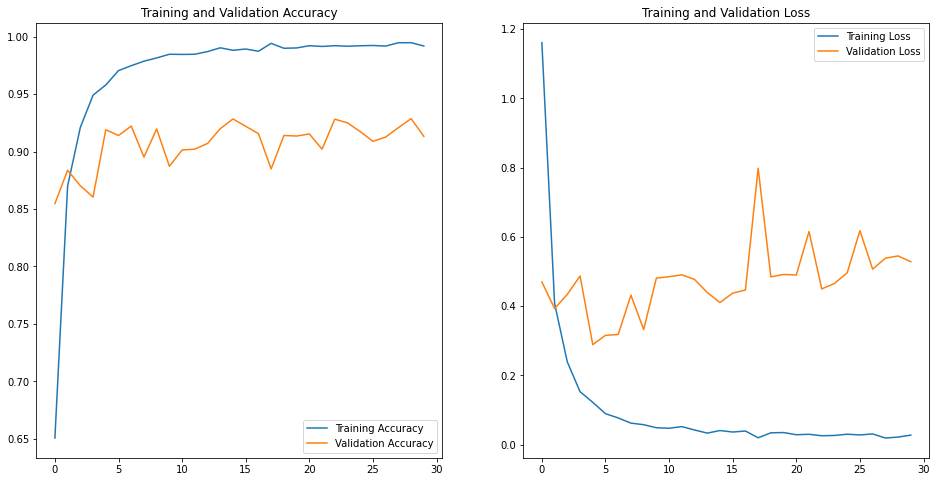

In [26]:
m4.run(tds=train_ds, vds=val_ds, ttds=test_ds)

##### Model T1 : With Transfer Learning Xception

##### Model T2 : With Transfer Learning Xception

In [23]:
# Load the state of the art
xception = tf.keras.applications.Xception(
    weights="imagenet", input_shape=input_shape, include_top=False
)
# Freeze params
xception.trainable = False

inputs = tf.keras.Input(shape=input_shape)
x = resize(inputs)
x = layers.Rescaling(scale=1 / 127.5, offset=-1)(x)
# x = data_augmentation(x)
x = xception(x, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.2)(x)
outputs = layers.Dense(all_classes_count, activation="softmax")(x)

mt2 = mb(model=tf.keras.Model(inputs, outputs), input_shape=input_shape,name="mt2")


👉 Building and compiling...
Total Parameter 20908607


In [24]:
mt2.model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 256, 256, 3)       0         
                                                                 
 rescaling_1 (Rescaling)     (None, 256, 256, 3)       0         
                                                                 
 xception (Functional)       (None, 8, 8, 2048)        20861480  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dropout (Dropout)           (None, 2048)              0         
                                                             



👉 Fitting the model...
Epoch 1/30
955/955 [==============================] - 329s 308ms/step - loss: 0.5641 - accuracy: 0.8571 - val_loss: 0.2426 - val_accuracy: 0.9348
Epoch 2/30
955/955 [==============================] - 108s 113ms/step - loss: 0.2032 - accuracy: 0.9442 - val_loss: 0.1661 - val_accuracy: 0.9526
Epoch 3/30
955/955 [==============================] - 118s 123ms/step - loss: 0.1458 - accuracy: 0.9585 - val_loss: 0.1429 - val_accuracy: 0.9567
Epoch 4/30
955/955 [==============================] - 117s 122ms/step - loss: 0.1147 - accuracy: 0.9664 - val_loss: 0.1288 - val_accuracy: 0.9602
Epoch 5/30
955/955 [==============================] - 105s 110ms/step - loss: 0.0967 - accuracy: 0.9713 - val_loss: 0.1139 - val_accuracy: 0.9620
Epoch 6/30
955/955 [==============================] - 106s 111ms/step - loss: 0.0823 - accuracy: 0.9757 - val_loss: 0.1053 - val_accuracy: 0.9647
Epoch 7/30
955/955 [==============================] - 119s 124ms/step - loss: 0.0724 - accuracy: 0.

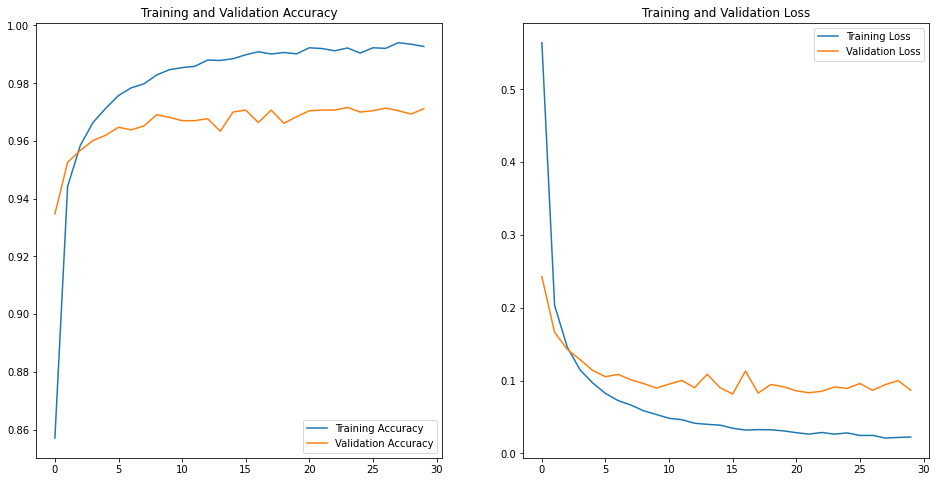

In [25]:
mt2.run(tds=train_ds, vds=val_ds, ttds=test_ds)

##### Model T3 : With Transfer Learning ResNet

In [26]:
# Load the state of the art
resnet = tf.keras.applications.ResNet50V2(
    weights="imagenet", input_shape=input_shape, include_top=False
)
# Freeze params
resnet.trainable = False

inputs = tf.keras.Input(shape=input_shape)
x = resize(inputs)
x = layers.Rescaling(scale=1 / 127.5, offset=-1)(x)
# x = data_augmentation(x)
x = resnet(x, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.2)(x)
outputs = layers.Dense(all_classes_count, activation="softmax")(x)

mt3 = mb(model=tf.keras.Model(inputs, outputs), input_shape=input_shape,name="mt3")

👉 Building and compiling...
Total Parameter 23611927


In [27]:
mt3.model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 256, 256, 3)       0         
                                                                 
 rescaling_2 (Rescaling)     (None, 256, 256, 3)       0         
                                                                 
 resnet50v2 (Functional)     (None, 8, 8, 2048)        23564800  
                                                                 
 global_average_pooling2d_1   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dropout_1 (Dropout)         (None, 2048)              0         
                                                           



👉 Fitting the model...
Epoch 1/30
955/955 [==============================] - 101s 102ms/step - loss: 0.3690 - accuracy: 0.8991 - val_loss: 0.1249 - val_accuracy: 0.9645
Epoch 2/30
955/955 [==============================] - 99s 103ms/step - loss: 0.0999 - accuracy: 0.9701 - val_loss: 0.0878 - val_accuracy: 0.9718
Epoch 3/30
955/955 [==============================] - 98s 103ms/step - loss: 0.0670 - accuracy: 0.9796 - val_loss: 0.0763 - val_accuracy: 0.9771
Epoch 4/30
955/955 [==============================] - 87s 91ms/step - loss: 0.0548 - accuracy: 0.9832 - val_loss: 0.0775 - val_accuracy: 0.9748
Epoch 5/30
955/955 [==============================] - 96s 100ms/step - loss: 0.0451 - accuracy: 0.9859 - val_loss: 0.0649 - val_accuracy: 0.9794
Epoch 6/30
955/955 [==============================] - 89s 93ms/step - loss: 0.0391 - accuracy: 0.9879 - val_loss: 0.0632 - val_accuracy: 0.9783
Epoch 7/30
955/955 [==============================] - 88s 92ms/step - loss: 0.0321 - accuracy: 0.9906 - va

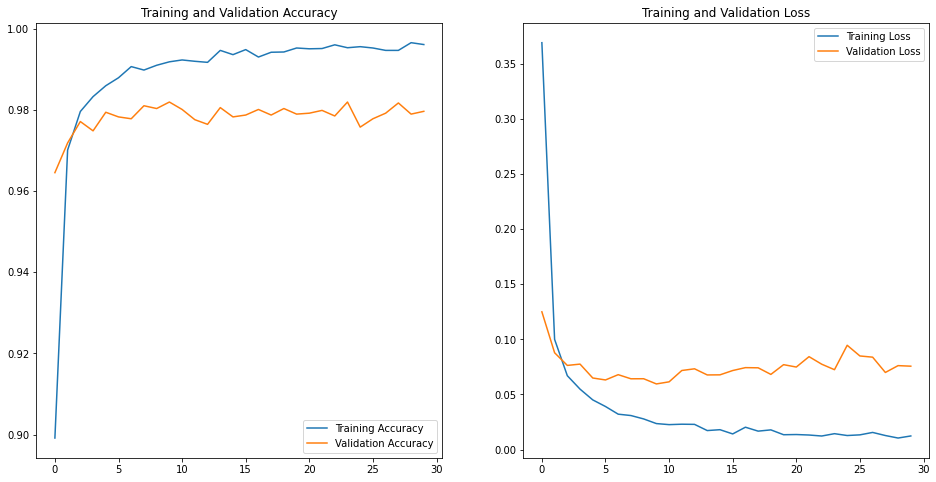

In [28]:
mt3.run(tds=train_ds, vds=val_ds, ttds=test_ds)

##### Model T4 : With Transfer Learning Inception

In [25]:
# Load the state of the art
inception = tf.keras.applications.InceptionV3(
    weights="imagenet", input_shape=input_shape, include_top=False
)
# Freeze params
inception.trainable = False

inputs = tf.keras.Input(shape=input_shape)
x = resize(inputs)
x = layers.Rescaling(scale=1 / 127.5, offset=-1)(x)
# x = data_augmentation(x)
x = inception(x, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.1)(x)
outputs = layers.Dense(all_classes_count, activation="softmax")(x)

mt4 = mb(model=tf.keras.Model(inputs, outputs), input_shape=input_shape,name="mt4", epoch=15)

👉 Building and compiling...
Total Parameter 21849911


In [26]:
mt4.model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 256, 256, 3)       0         
                                                                 
 rescaling_1 (Rescaling)     (None, 256, 256, 3)       0         
                                                                 
 inception_v3 (Functional)   (None, 6, 6, 2048)        21802784  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dropout (Dropout)           (None, 2048)              0         
                                                             



👉 Fitting the model...
Epoch 1/15
955/955 [==============================] - 338s 308ms/step - loss: 0.5413 - accuracy: 0.8520 - val_loss: 4779.2832 - val_accuracy: 0.9288
Epoch 2/15
955/955 [==============================] - 77s 81ms/step - loss: 0.1977 - accuracy: 0.9372 - val_loss: 0.1772 - val_accuracy: 0.9467
Epoch 3/15
955/955 [==============================] - 72s 75ms/step - loss: 575900.8125 - accuracy: 0.9330 - val_loss: 0.2018 - val_accuracy: 0.9322
Epoch 4/15
955/955 [==============================] - 88s 92ms/step - loss: 0.1157 - accuracy: 0.9629 - val_loss: 0.1469 - val_accuracy: 0.9563
Epoch 5/15
955/955 [==============================] - 123s 129ms/step - loss: 0.0990 - accuracy: 0.9688 - val_loss: 0.1348 - val_accuracy: 0.9556
Epoch 6/15
955/955 [==============================] - 177s 185ms/step - loss: 1771858.7500 - accuracy: 0.9724 - val_loss: 1.6673 - val_accuracy: 0.6696
Epoch 7/15
955/955 [==============================] - 77s 81ms/step - loss: 0.1644 - accura

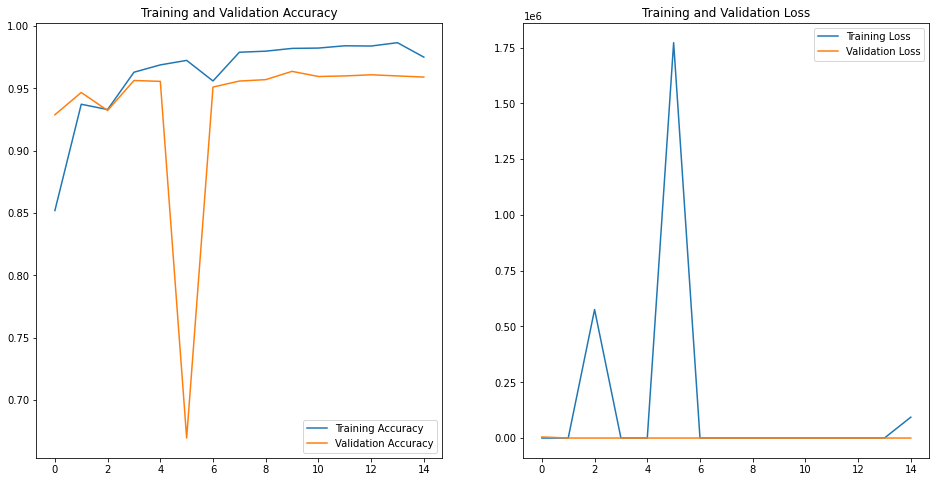

In [27]:
mt4.run(tds=train_ds, vds=val_ds, ttds=test_ds)

##### Model T5 : With Transfer Learning MobileNet

In [28]:
# Load the state of the art
mobilenet = tf.keras.applications.MobileNetV3Small(
    weights="imagenet", include_top=False
)
# Freeze params
mobilenet.trainable = False

inputs = tf.keras.Input(shape=input_shape)
x = resize(inputs)
x = layers.Rescaling(scale=1 / 127.5, offset=-1)(x)
# x = data_augmentation(x)
x = mobilenet(x, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.1)(x)
outputs = layers.Dense(all_classes_count, activation="softmax")(x)

mt5 = mb(model=tf.keras.Model(inputs, outputs), input_shape=input_shape,name="mt5")

👉 Building and compiling...
Total Parameter 952391


In [29]:
mt5.model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 256, 256, 3)       0         
                                                                 
 rescaling_3 (Rescaling)     (None, 256, 256, 3)       0         
                                                                 
 MobilenetV3small (Functiona  (None, None, None, 576)  939120    
 l)                                                              
                                                                 
 global_average_pooling2d_1   (None, 576)              0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dropout_1 (Dropout)         (None, 576)               0   

In [ ]:
# mt5.run(tds=train_ds, vds=val_ds, ttds=test_ds)



👉 Fitting the model...
Epoch 1/10
819/819 [==============================] - 800s 970ms/step - loss: 2.8673 - accuracy: 0.1637 - val_loss: 2.7243 - val_accuracy: 0.2326
Epoch 2/10
819/819 [==============================] - ETA: 0s - loss: 2.6391 - accuracy: 0.2386

KeyboardInterrupt: 

##### Model T6 : With Transfer Learning DenseNet

In [30]:
# Load the state of the art
densenet = tf.keras.applications.DenseNet121(
    weights="imagenet", input_shape=input_shape, include_top=False
)
# Freeze params
densenet.trainable = False

inputs = tf.keras.Input(shape=input_shape)
x = resize(inputs)
x = layers.Rescaling(scale=1 / 127.5, offset=-1)(x)
# x = data_augmentation(x)
x = densenet(x, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.1)(x)
outputs = layers.Dense(all_classes_count, activation="softmax")(x)

mt6 = mb(model=tf.keras.Model(inputs, outputs), input_shape=input_shape,name="mt6")

👉 Building and compiling...
Total Parameter 7061079


In [31]:
mt6.model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 256, 256, 3)       0         
                                                                 
 rescaling_4 (Rescaling)     (None, 256, 256, 3)       0         
                                                                 
 densenet121 (Functional)    (None, 8, 8, 1024)        7037504   
                                                                 
 global_average_pooling2d_2   (None, 1024)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dropout_2 (Dropout)         (None, 1024)              0         
                                                           



👉 Fitting the model...
Epoch 1/30
955/955 [==============================] - 323s 338ms/step - loss: 0.1294 - accuracy: 0.9658 - val_loss: 0.0963 - val_accuracy: 0.9757
Epoch 2/30
955/955 [==============================] - 98s 102ms/step - loss: 0.0847 - accuracy: 0.9772 - val_loss: 0.0685 - val_accuracy: 0.9789
Epoch 3/30
955/955 [==============================] - 225s 236ms/step - loss: 0.0669 - accuracy: 0.9820 - val_loss: 0.0701 - val_accuracy: 0.9792
Epoch 4/30
955/955 [==============================] - 120s 125ms/step - loss: 0.0555 - accuracy: 0.9838 - val_loss: 0.0583 - val_accuracy: 0.9817
Epoch 5/30
955/955 [==============================] - 108s 113ms/step - loss: 0.0476 - accuracy: 0.9857 - val_loss: 0.0496 - val_accuracy: 0.9831
Epoch 6/30
955/955 [==============================] - 86s 90ms/step - loss: 0.0438 - accuracy: 0.9856 - val_loss: 0.0450 - val_accuracy: 0.9849
Epoch 7/30
955/955 [==============================] - 147s 154ms/step - loss: 0.0390 - accuracy: 0.987

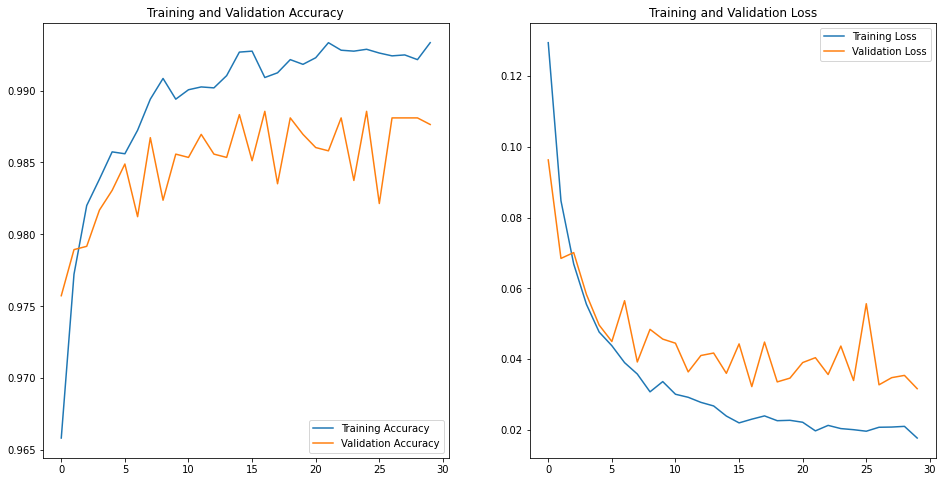

In [33]:
mt6.run(tds=train_ds, vds=val_ds, ttds=test_ds)

##### Model T7 : With Transfer Learning EfficientNet

In [26]:
# Load the state of the art
efficientnet = tf.keras.applications.EfficientNetV2S(
    weights="imagenet", input_shape=input_shape, include_top=False
)
# Freeze params
efficientnet.trainable = False

inputs = tf.keras.Input(shape=input_shape)
x = resize(inputs)
x = layers.Rescaling(scale=1 / 127.5, offset=-1)(x)
# x = data_augmentation(x)
x = efficientnet(x, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.1)(x)
outputs = layers.Dense(all_classes_count, activation="softmax")(x)

mt7 = mb(model=tf.keras.Model(inputs, outputs), input_shape=input_shape,name="mt7")

👉 Building and compiling...
Total Parameter 20360823


In [27]:
mt7.model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 256, 256, 3)       0         
                                                                 
 rescaling_2 (Rescaling)     (None, 256, 256, 3)       0         
                                                                 
 efficientnetv2-s (Functiona  (None, 8, 8, 1280)       20331360  
 l)                                                              
                                                                 
 global_average_pooling2d (G  (None, 1280)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dropout (Dropout)           (None, 1280)              0     



👉 Fitting the model...
Epoch 1/30
955/955 [==============================] - 332s 305ms/step - loss: 1.7639 - accuracy: 0.4857 - val_loss: 1.3655 - val_accuracy: 0.6117
Epoch 2/30
955/955 [==============================] - 117s 122ms/step - loss: 1.2452 - accuracy: 0.6292 - val_loss: 1.1537 - val_accuracy: 0.6541
Epoch 3/30
955/955 [==============================] - 129s 135ms/step - loss: 1.0859 - accuracy: 0.6741 - val_loss: 1.0212 - val_accuracy: 0.6937
Epoch 4/30
955/955 [==============================] - 152s 159ms/step - loss: 0.9946 - accuracy: 0.7002 - val_loss: 0.9566 - val_accuracy: 0.7189
Epoch 5/30
955/955 [==============================] - 156s 163ms/step - loss: 1910.1552 - accuracy: 0.7135 - val_loss: 0.8992 - val_accuracy: 0.7324
Epoch 6/30
955/955 [==============================] - 139s 145ms/step - loss: 0.8838 - accuracy: 0.7253 - val_loss: 0.8564 - val_accuracy: 0.7491
Epoch 7/30
955/955 [==============================] - 150s 157ms/step - loss: 0.8506 - accuracy:

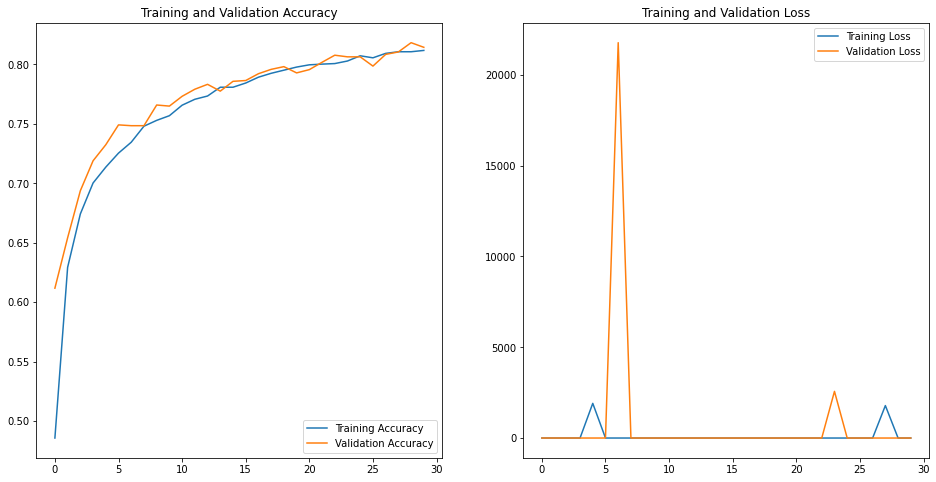

In [28]:
mt7.run(tds=train_ds, vds=val_ds, ttds=test_ds)

---

### Model Evaluation

##### Sample model test for single image

In [20]:
test_m1 = mtp(labels=all_classes,name="m1")
test_m1.predict("data\Grape___Black_rot\image (2).JPG")

1/1 [==============================] - 2s 2s/step


'Grape___Black_rot'

##### Model 1 : Results From Scratch CNN

1/1 [==============================] - 0s 62ms/step
First Image of batch to predict :
Actual label :  Apple___Apple_scab
Predicted label :  Apple___Apple_scab


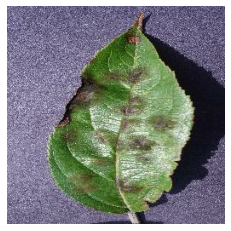

In [24]:
# Model Evaluation on test data
test_m1 = mtp(test_ds=test_ds,labels=all_classes,name="m1")
test_m1.single_image_test()

1/1 [==============================] - 0s 29ms/step


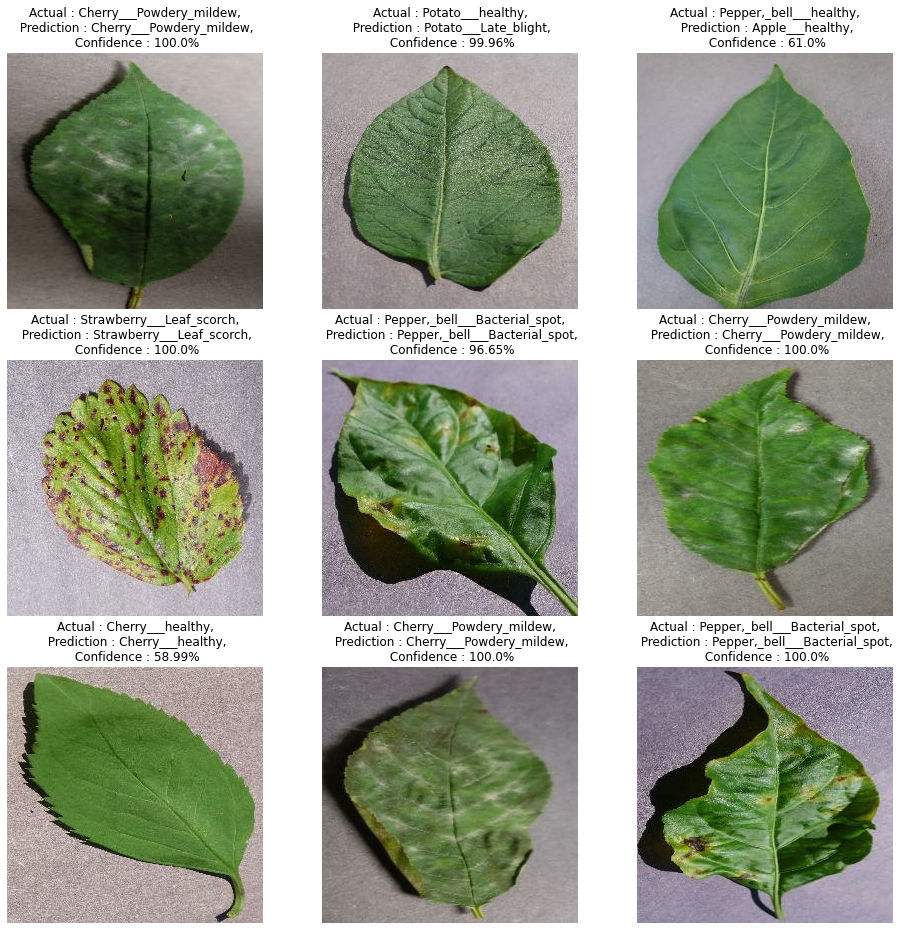

In [25]:
test_m1.random_imageset_test()

137/137 [==============================] - 1s 9ms/step


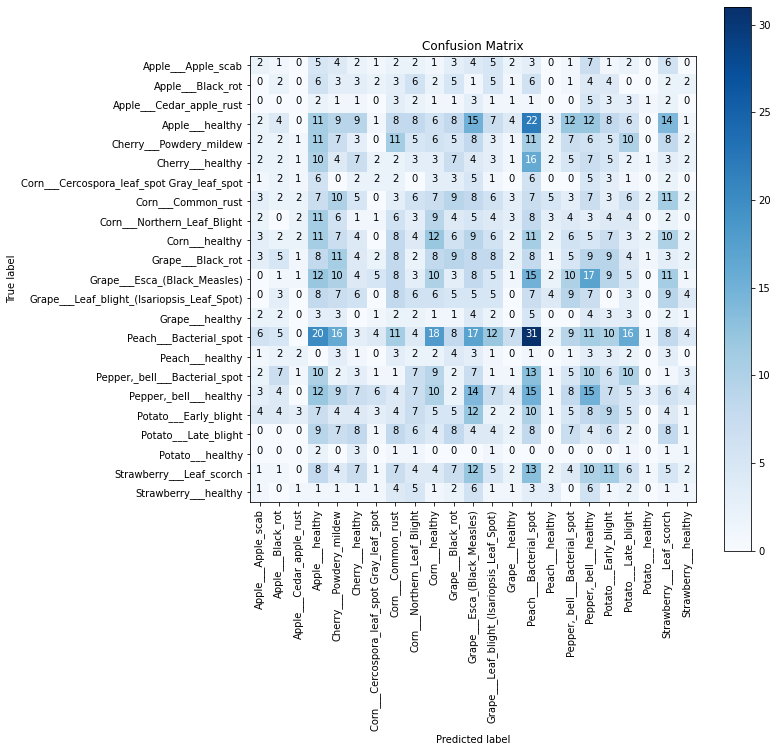

In [26]:
test_m1.plot_cf()

In [27]:
test_m1.print_cr()

Classification Report
                                            precision    recall  f1-score   support

                        Apple___Apple_scab       0.05      0.04      0.04        54
                         Apple___Black_rot       0.04      0.03      0.04        58
                  Apple___Cedar_apple_rust       0.00      0.00      0.00        31
                           Apple___healthy       0.06      0.06      0.06       170
                   Cherry___Powdery_mildew       0.05      0.06      0.06       116
                          Cherry___healthy       0.08      0.07      0.08        94
Corn___Cercospora_leaf_spot Gray_leaf_spot       0.06      0.04      0.05        45
                        Corn___Common_rust       0.03      0.03      0.03       117
               Corn___Northern_Leaf_Blight       0.03      0.04      0.03        85
                            Corn___healthy       0.09      0.10      0.10       124
                         Grape___Black_rot       0.08

##### Model 2 : Results With Augmentation CNN

1/1 [==============================] - 0s 65ms/step
First Image of batch to predict :
Actual label :  Grape___Black_rot
Predicted label :  Grape___Black_rot


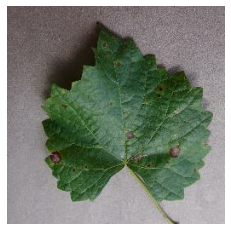

In [28]:
test_m2 = mtp(test_ds=test_ds,labels=all_classes,name="m2")
test_m2.single_image_test()


1/1 [==============================] - 0s 27ms/step


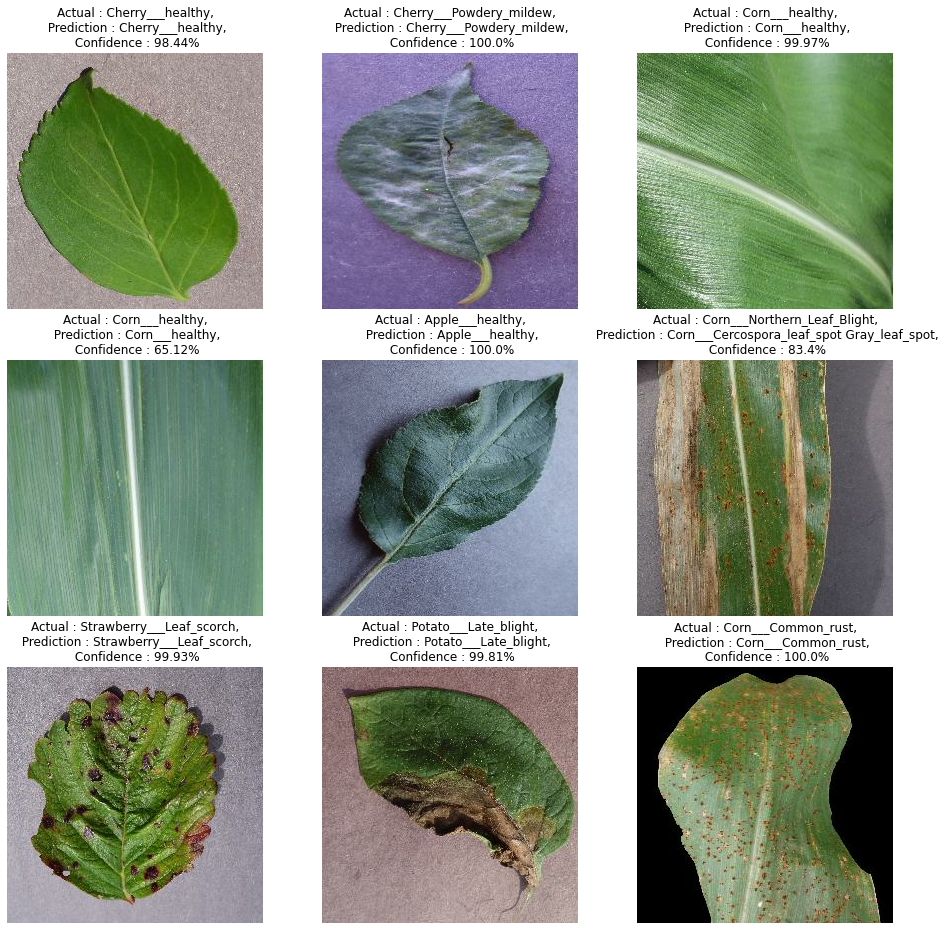

In [29]:
test_m2.random_imageset_test()


137/137 [==============================] - 1s 10ms/step


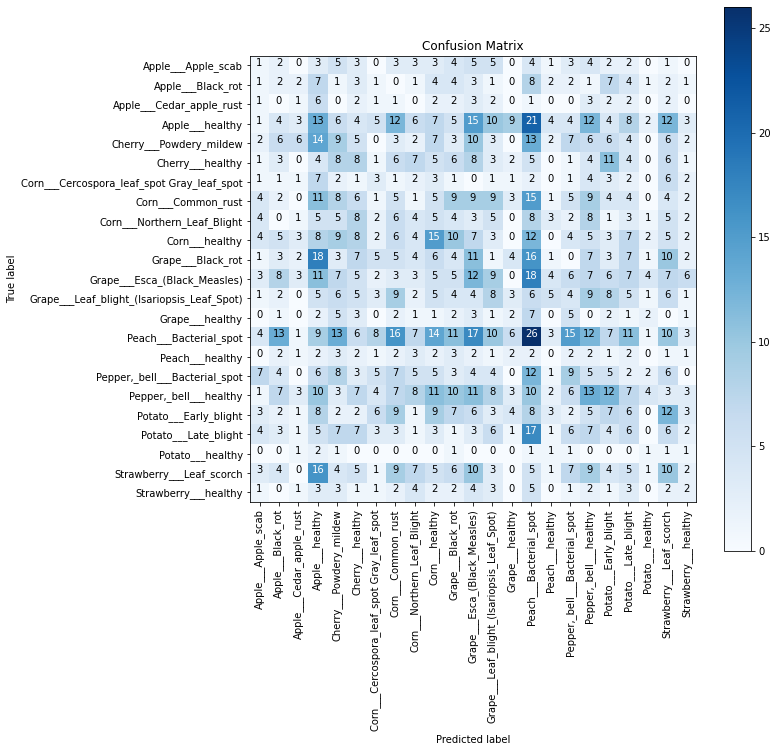

In [30]:
test_m2.plot_cf()


In [31]:
test_m2.print_cr()

Classification Report
                                            precision    recall  f1-score   support

                        Apple___Apple_scab       0.02      0.02      0.02        54
                         Apple___Black_rot       0.03      0.03      0.03        58
                  Apple___Cedar_apple_rust       0.03      0.03      0.03        31
                           Apple___healthy       0.07      0.08      0.08       170
                   Cherry___Powdery_mildew       0.08      0.08      0.08       116
                          Cherry___healthy       0.08      0.09      0.08        94
Corn___Cercospora_leaf_spot Gray_leaf_spot       0.05      0.07      0.06        45
                        Corn___Common_rust       0.04      0.04      0.04       117
               Corn___Northern_Leaf_Blight       0.05      0.05      0.05        85
                            Corn___healthy       0.12      0.12      0.12       124
                         Grape___Black_rot       0.04

##### Model 3 : Results With Batch Normalization CNN

1/1 [==============================] - 0s 294ms/step
First Image of batch to predict :
Actual label :  Potato___Early_blight
Predicted label :  Potato___Early_blight


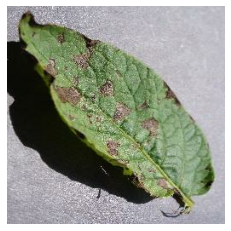

In [32]:
test_m3 = mtp(test_ds=test_ds,labels=all_classes,name="m3")
test_m3.single_image_test()


1/1 [==============================] - 0s 26ms/step


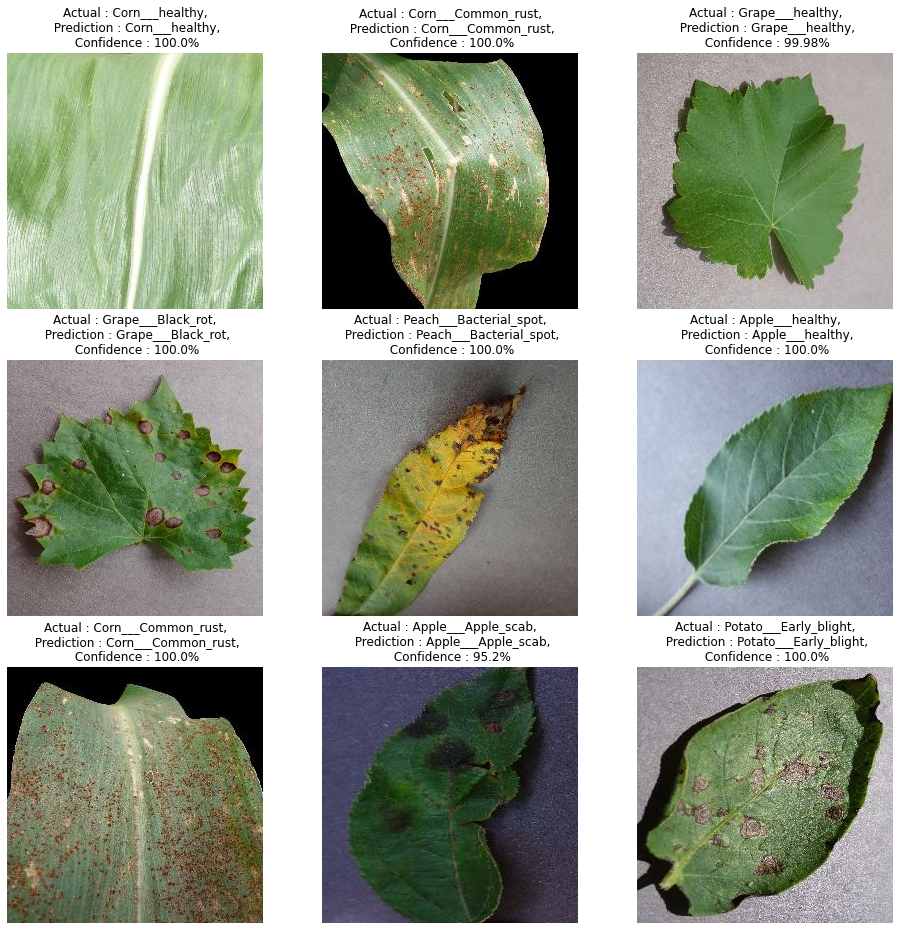

In [33]:
test_m3.random_imageset_test()


137/137 [==============================] - 1s 9ms/step


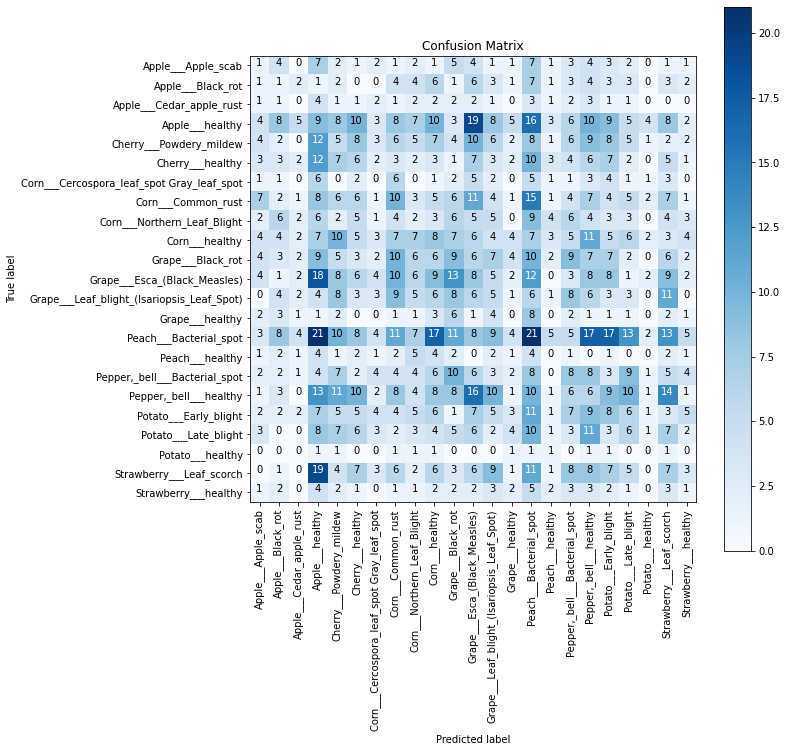

In [34]:
test_m3.plot_cf()


In [35]:
test_m3.print_cr()

Classification Report
                                            precision    recall  f1-score   support

                        Apple___Apple_scab       0.02      0.02      0.02        54
                         Apple___Black_rot       0.02      0.02      0.02        58
                  Apple___Cedar_apple_rust       0.00      0.00      0.00        31
                           Apple___healthy       0.05      0.05      0.05       170
                   Cherry___Powdery_mildew       0.04      0.04      0.04       116
                          Cherry___healthy       0.06      0.06      0.06        94
Corn___Cercospora_leaf_spot Gray_leaf_spot       0.00      0.00      0.00        45
                        Corn___Common_rust       0.08      0.09      0.08       117
               Corn___Northern_Leaf_Blight       0.02      0.02      0.02        85
                            Corn___healthy       0.06      0.06      0.06       124
                         Grape___Black_rot       0.08

##### Model 4 : Results With dropouts CNN

1/1 [==============================] - 0s 163ms/step
First Image of batch to predict :
Actual label :  Pepper,_bell___healthy
Predicted label :  Pepper,_bell___healthy


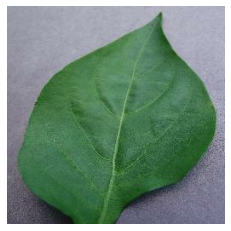

In [36]:
test_m4 = mtp(test_ds=test_ds,labels=all_classes,name="m4")
test_m4.single_image_test()


1/1 [==============================] - 0s 21ms/step


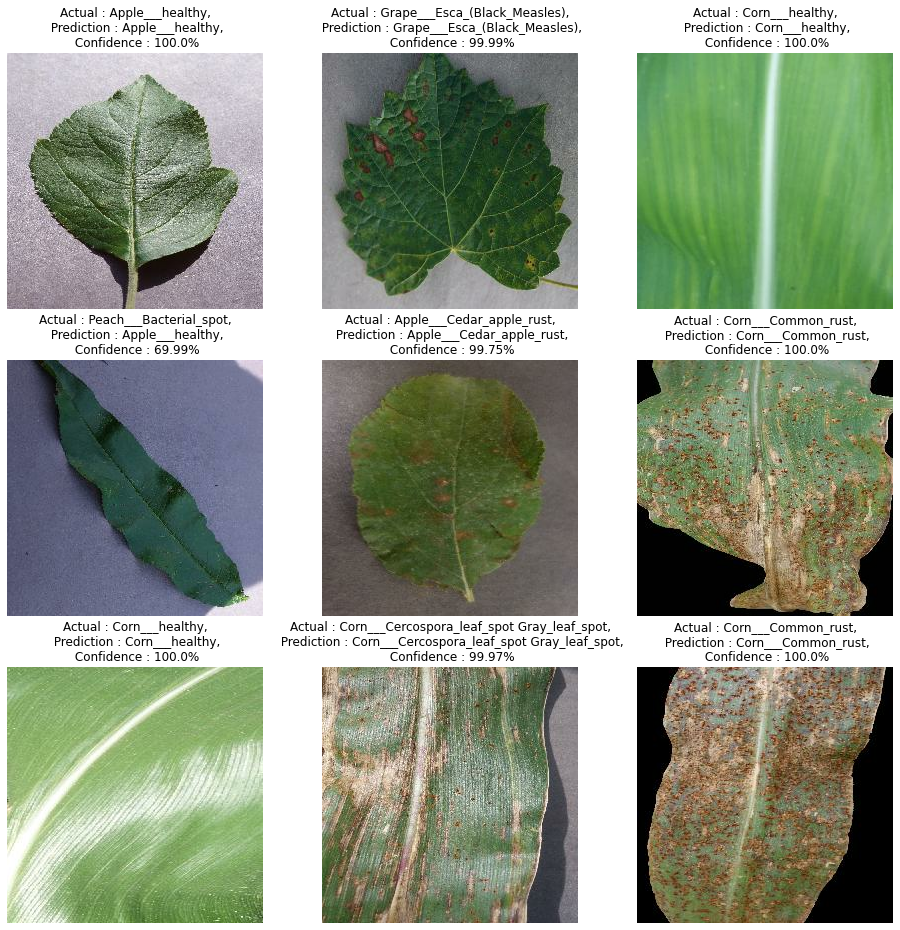

In [37]:
test_m4.random_imageset_test()


137/137 [==============================] - 1s 10ms/step


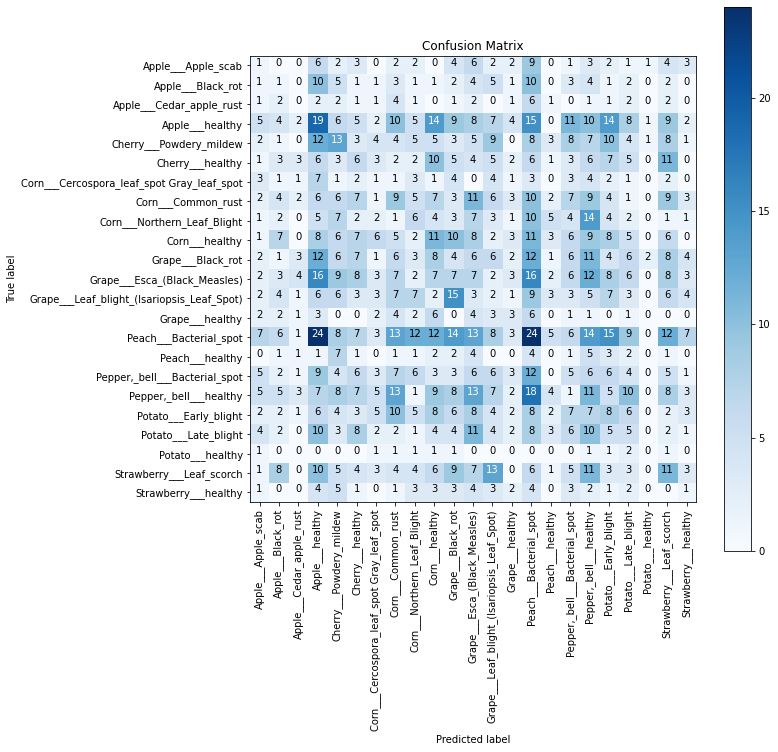

In [38]:
test_m4.plot_cf()


In [39]:
test_m4.print_cr()

Classification Report
                                            precision    recall  f1-score   support

                        Apple___Apple_scab       0.02      0.02      0.02        54
                         Apple___Black_rot       0.02      0.02      0.02        58
                  Apple___Cedar_apple_rust       0.00      0.00      0.00        31
                           Apple___healthy       0.10      0.11      0.11       170
                   Cherry___Powdery_mildew       0.11      0.11      0.11       116
                          Cherry___healthy       0.07      0.06      0.06        94
Corn___Cercospora_leaf_spot Gray_leaf_spot       0.02      0.02      0.02        45
                        Corn___Common_rust       0.08      0.08      0.08       117
               Corn___Northern_Leaf_Blight       0.07      0.07      0.07        85
                            Corn___healthy       0.09      0.09      0.09       124
                         Grape___Black_rot       0.03

##### Model T2 : Results With Xception

1/1 [==============================] - 1s 1s/step
First Image of batch to predict :
Actual label :  Grape___Esca_(Black_Measles)
Predicted label :  Grape___Esca_(Black_Measles)


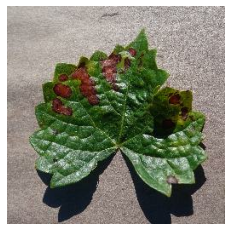

In [40]:
test_mt2 = mtp(test_ds=test_ds,labels=all_classes,name="mt2")
test_mt2.single_image_test()


1/1 [==============================] - 0s 38ms/step


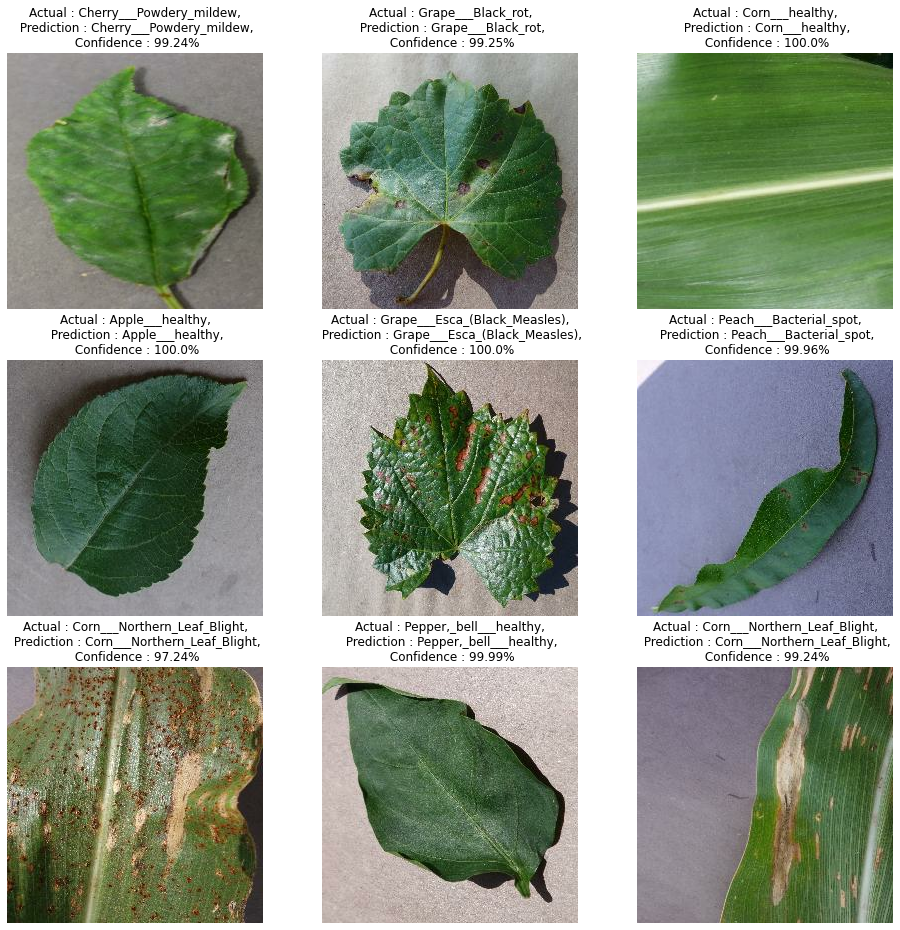

In [41]:
test_mt2.random_imageset_test()


137/137 [==============================] - 10s 66ms/step


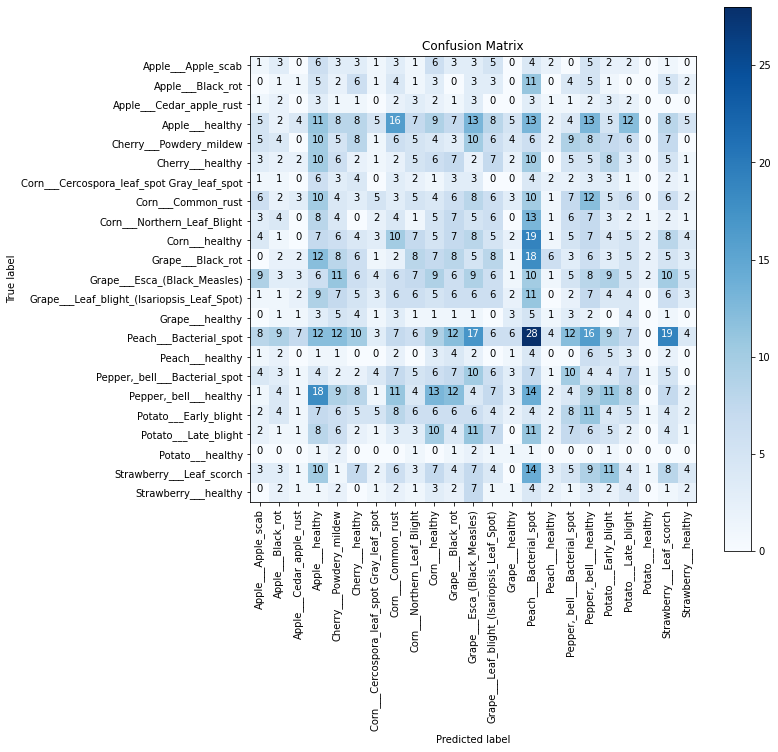

In [42]:
test_mt2.plot_cf()


In [43]:
test_mt2.print_cr()

Classification Report
                                            precision    recall  f1-score   support

                        Apple___Apple_scab       0.02      0.02      0.02        54
                         Apple___Black_rot       0.02      0.02      0.02        58
                  Apple___Cedar_apple_rust       0.00      0.00      0.00        31
                           Apple___healthy       0.07      0.06      0.07       170
                   Cherry___Powdery_mildew       0.04      0.04      0.04       116
                          Cherry___healthy       0.02      0.02      0.02        94
Corn___Cercospora_leaf_spot Gray_leaf_spot       0.00      0.00      0.00        45
                        Corn___Common_rust       0.03      0.03      0.03       117
               Corn___Northern_Leaf_Blight       0.01      0.01      0.01        85
                            Corn___healthy       0.04      0.04      0.04       124
                         Grape___Black_rot       0.07

##### Model T3 : Results With RestNet

1/1 [==============================] - 1s 1s/step
First Image of batch to predict :
Actual label :  Strawberry___healthy
Predicted label :  Strawberry___healthy


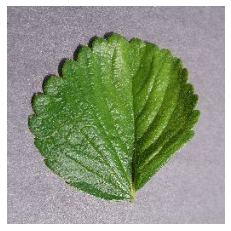

In [44]:
test_mt3 = mtp(test_ds=test_ds,labels=all_classes,name="mt3")
test_mt3.single_image_test()


1/1 [==============================] - 0s 28ms/step


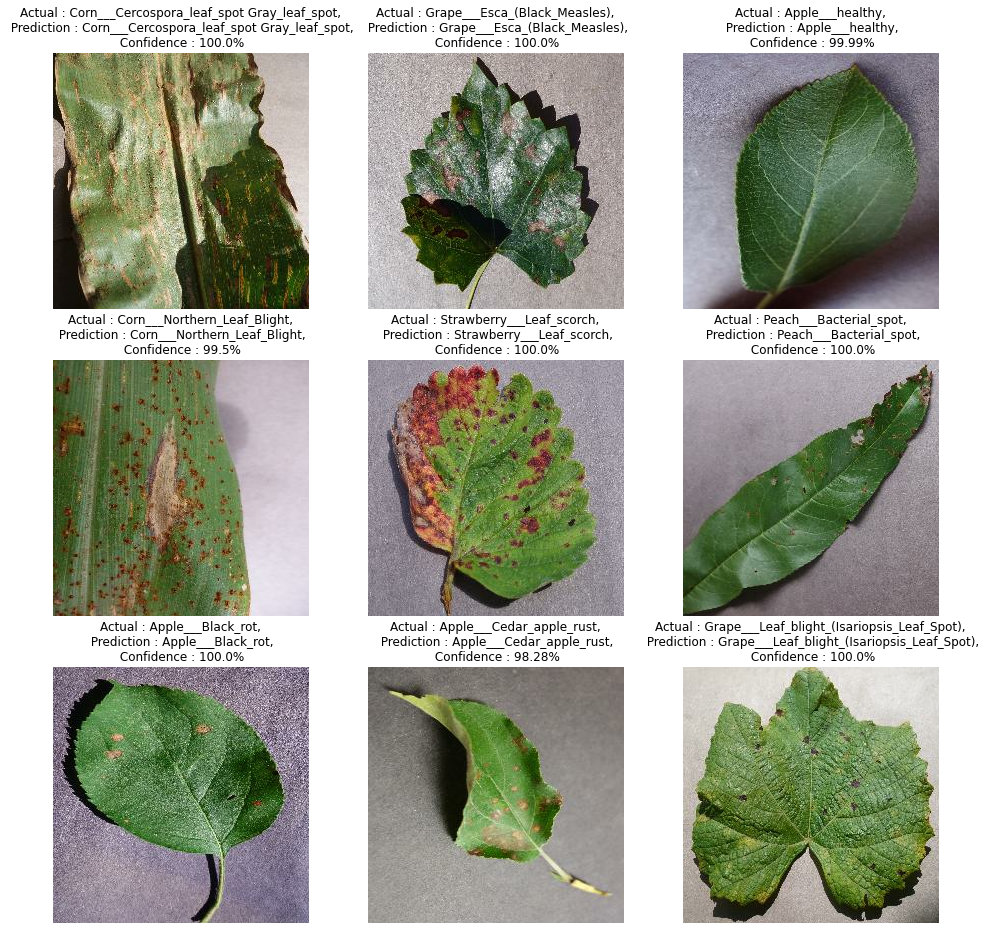

In [45]:
test_mt3.random_imageset_test()


137/137 [==============================] - 8s 52ms/step


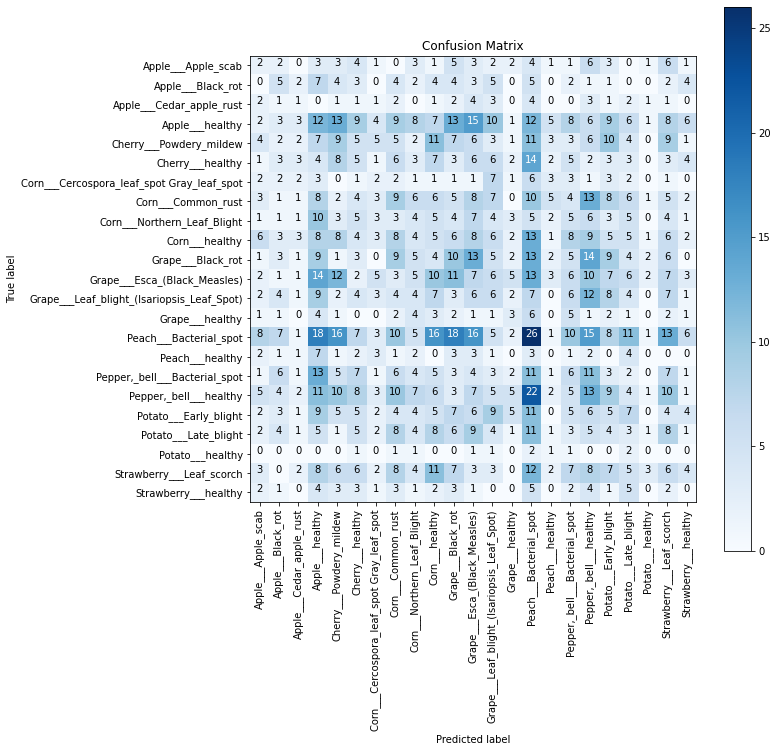

In [46]:
test_mt3.plot_cf()


In [47]:
test_mt3.print_cr()

Classification Report
                                            precision    recall  f1-score   support

                        Apple___Apple_scab       0.04      0.04      0.04        54
                         Apple___Black_rot       0.09      0.09      0.09        58
                  Apple___Cedar_apple_rust       0.03      0.03      0.03        31
                           Apple___healthy       0.07      0.07      0.07       170
                   Cherry___Powdery_mildew       0.08      0.08      0.08       116
                          Cherry___healthy       0.05      0.05      0.05        94
Corn___Cercospora_leaf_spot Gray_leaf_spot       0.04      0.04      0.04        45
                        Corn___Common_rust       0.08      0.08      0.08       117
               Corn___Northern_Leaf_Blight       0.05      0.05      0.05        85
                            Corn___healthy       0.04      0.04      0.04       124
                         Grape___Black_rot       0.08

##### Model T4 : Results With InceptionNet

1/1 [==============================] - 1s 1s/step
First Image of batch to predict :
Actual label :  Corn___Cercospora_leaf_spot Gray_leaf_spot
Predicted label :  Corn___Cercospora_leaf_spot Gray_leaf_spot


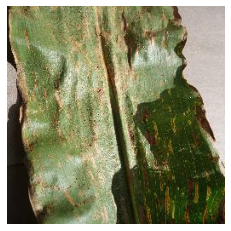

In [48]:
test_mt4 = mtp(test_ds=test_ds,labels=all_classes,name="mt4")
test_mt4.single_image_test()


1/1 [==============================] - 0s 37ms/step


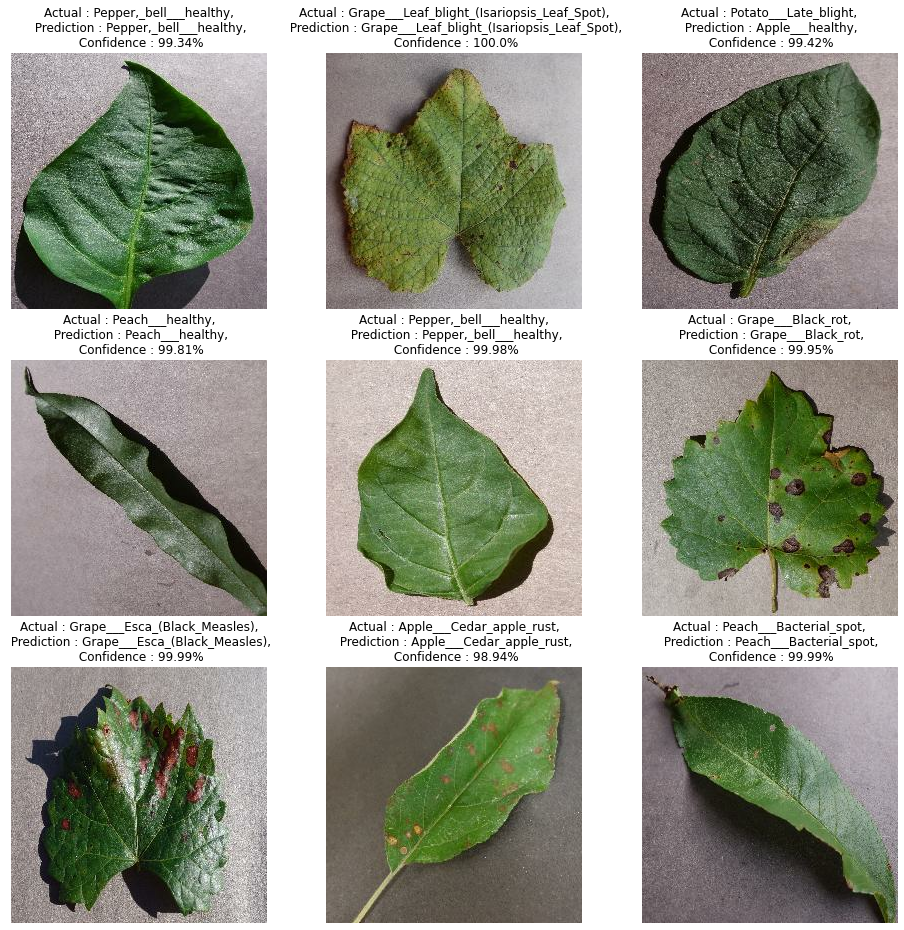

In [49]:
test_mt4.random_imageset_test()


137/137 [==============================] - 6s 37ms/step


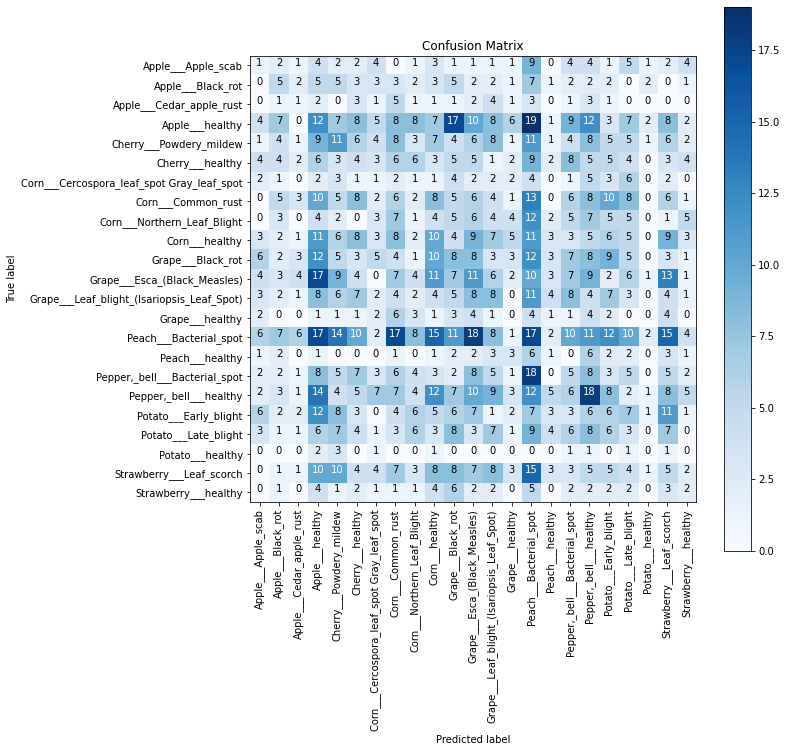

In [50]:
test_mt4.plot_cf()


In [51]:
test_mt4.print_cr()

Classification Report
                                            precision    recall  f1-score   support

                        Apple___Apple_scab       0.02      0.02      0.02        54
                         Apple___Black_rot       0.08      0.09      0.08        58
                  Apple___Cedar_apple_rust       0.03      0.03      0.03        31
                           Apple___healthy       0.07      0.07      0.07       170
                   Cherry___Powdery_mildew       0.09      0.09      0.09       116
                          Cherry___healthy       0.04      0.04      0.04        94
Corn___Cercospora_leaf_spot Gray_leaf_spot       0.02      0.02      0.02        45
                        Corn___Common_rust       0.05      0.05      0.05       117
               Corn___Northern_Leaf_Blight       0.01      0.01      0.01        85
                            Corn___healthy       0.08      0.08      0.08       124
                         Grape___Black_rot       0.06

##### Model T6 : Results With DenseNet

1/1 [==============================] - 2s 2s/step
First Image of batch to predict :
Actual label :  Corn___Common_rust
Predicted label :  Corn___Common_rust


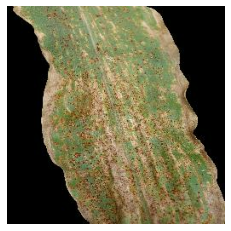

In [68]:
test_mt6 = mtp(test_ds=test_ds,labels=all_classes,name="mt6")
test_mt6.single_image_test()


1/1 [==============================] - 0s 35ms/step


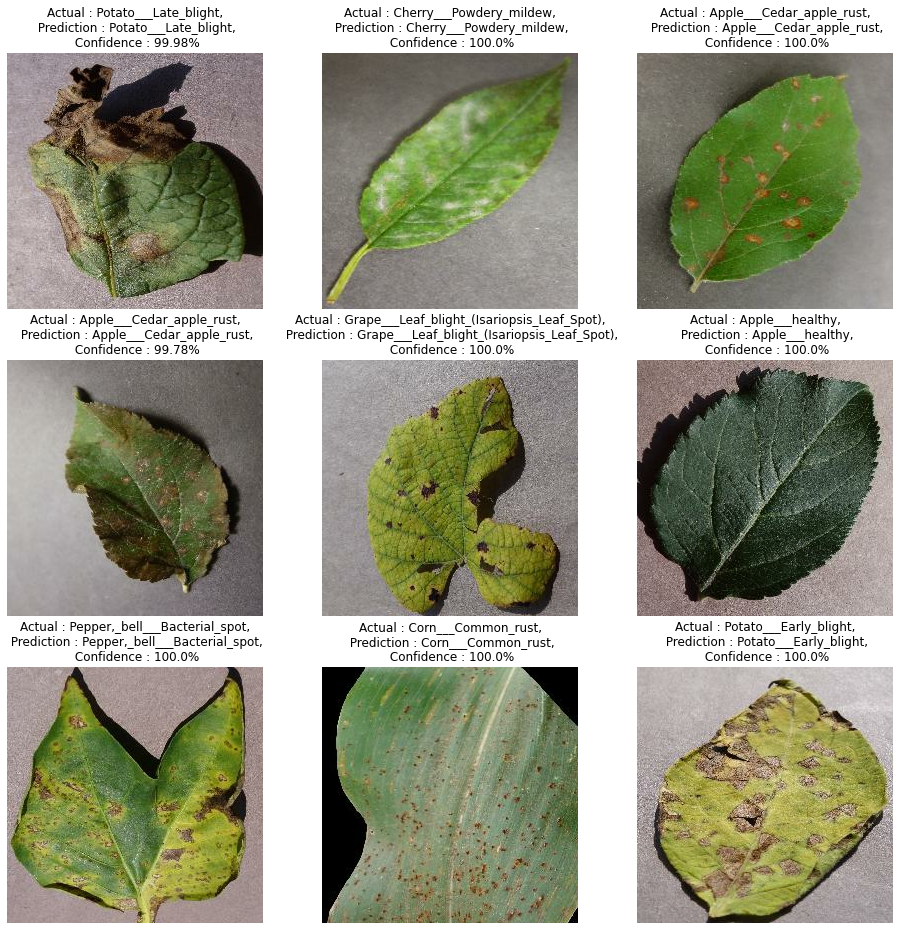

In [69]:
test_mt6.random_imageset_test()


137/137 [==============================] - 10s 57ms/step


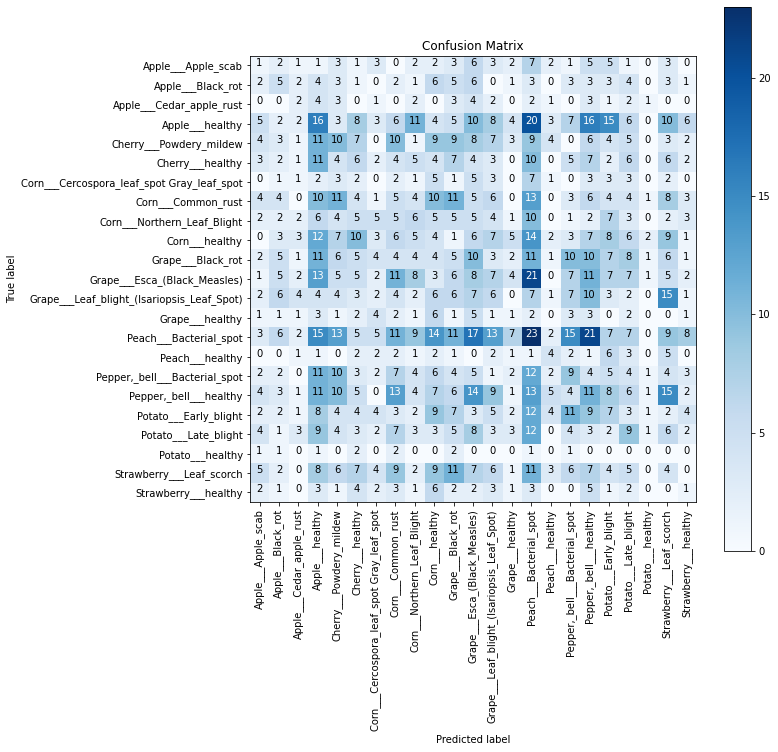

In [70]:
test_mt6.plot_cf()


In [71]:
test_mt6.print_cr()

Classification Report
                                            precision    recall  f1-score   support

                        Apple___Apple_scab       0.02      0.02      0.02        54
                         Apple___Black_rot       0.08      0.09      0.09        58
                  Apple___Cedar_apple_rust       0.06      0.06      0.06        31
                           Apple___healthy       0.09      0.09      0.09       170
                   Cherry___Powdery_mildew       0.09      0.09      0.09       116
                          Cherry___healthy       0.06      0.06      0.06        94
Corn___Cercospora_leaf_spot Gray_leaf_spot       0.00      0.00      0.00        45
                        Corn___Common_rust       0.04      0.04      0.04       117
               Corn___Northern_Leaf_Blight       0.08      0.07      0.07        85
                            Corn___healthy       0.03      0.03      0.03       124
                         Grape___Black_rot       0.04

##### Model T7 : Results With EfficientNet

1/1 [==============================] - 2s 2s/step
First Image of batch to predict :
Actual label :  Peach___Bacterial_spot
Predicted label :  Peach___Bacterial_spot


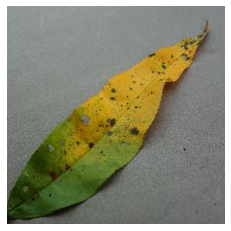

In [72]:
test_mt7 = mtp(test_ds=test_ds,labels=all_classes,name="mt7")
test_mt7.single_image_test()


1/1 [==============================] - 0s 39ms/step


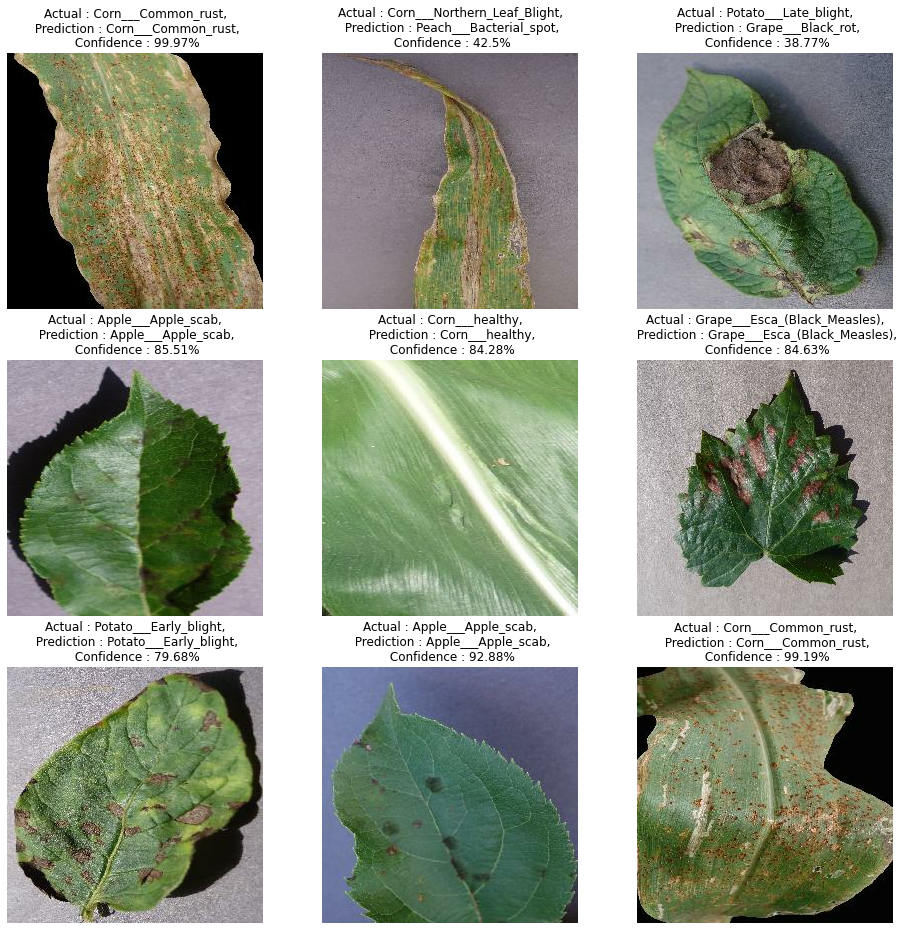

In [73]:
test_mt7.random_imageset_test()


137/137 [==============================] - 13s 77ms/step


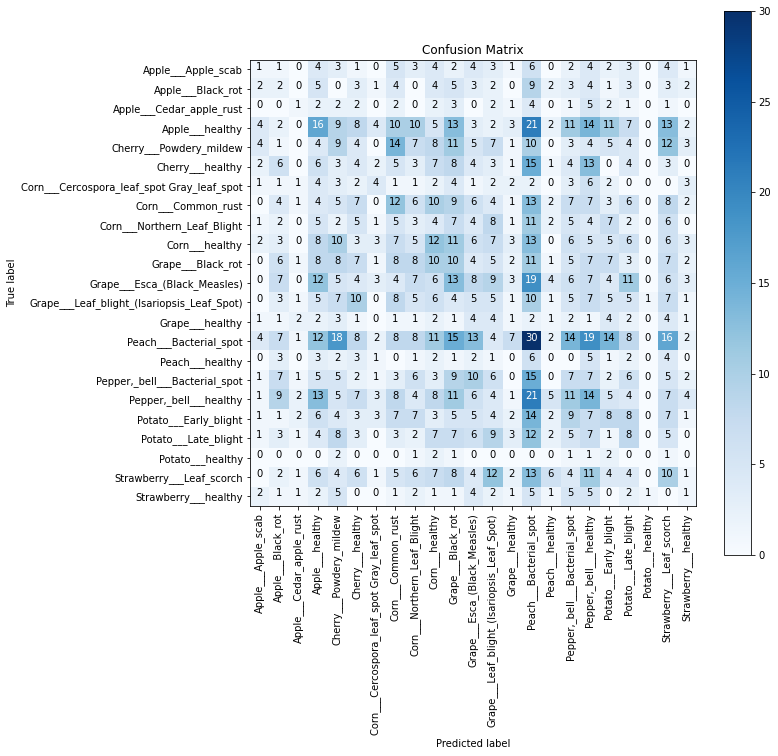

In [74]:
test_mt7.plot_cf()


In [75]:
test_mt7.print_cr()

Classification Report
                                            precision    recall  f1-score   support

                        Apple___Apple_scab       0.04      0.02      0.02        54
                         Apple___Black_rot       0.03      0.03      0.03        58
                  Apple___Cedar_apple_rust       0.06      0.03      0.04        31
                           Apple___healthy       0.12      0.09      0.10       170
                   Cherry___Powdery_mildew       0.07      0.08      0.08       116
                          Cherry___healthy       0.04      0.04      0.04        94
Corn___Cercospora_leaf_spot Gray_leaf_spot       0.13      0.09      0.11        45
                        Corn___Common_rust       0.10      0.10      0.10       117
               Corn___Northern_Leaf_Blight       0.03      0.04      0.03        85
                            Corn___healthy       0.10      0.10      0.10       124
                         Grape___Black_rot       0.06

---

### Conclusion

---